## Import Packages

In [1]:
# !pip install keras_tuner

In [2]:
!pip install tensorboard

In [3]:
!rm -r logs

In [4]:
# IMPORT TENSORFLOW
import tensorflow as tf

# IMPORT KERAS
import keras
from keras import regularizers
from keras.applications import EfficientNetV2B2, efficientnet
from keras.callbacks import Callback, TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
# import keras_tuner as kt

# IMPORT OTHERS
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from io import BytesIO

In [5]:
!git clone https://github.com/GitKentC/dataset.git

fatal: destination path 'dataset' already exists and is not an empty directory.


## Loading Data

In [6]:
# """ DATASET VARIABLES (FOR LOCAL)"""
# DATASET_NAME = 'garbage_classification'
# DATASET_DIR = f'../dataset/dupe_cleaned/{DATASET_NAME}'
# TRAIN_DIR = f'../dataset/split/{DATASET_NAME}/train'
# VALIDATION_DIR = f'../dataset/split/{DATASET_NAME}/validation'
# TEST_DIR = f'../dataset/split/{DATASET_NAME}/test'

In [7]:
""" DATASET VARIABLES (FOR COLAB)"""
# DATASET_NAME = 'garbage_classification'
DATASET_DIR = '/content/dataset/dupe_cleaned/garbage_classification'
TRAIN_DIR = '/content/dataset/split/garbage_classification/train'
VALIDATION_DIR = '/content/dataset/split/garbage_classification/validation'
TEST_DIR = '/content/dataset/split/garbage_classification/test'

In [8]:
""" Change this to match pre-trained models input; for consistency """
IMAGE_SIZE:tuple[int,int] = (256, 256)

BATCH_SIZE:int = 64                     # try testing this
LABEL_MODE:str = 'categorical'
COLOR_MODE:str = 'rgb'                 # accepts 'grayscale', 'rgb', and 'rgba' only
VALIDATION_SPLIT:float = 0.2           # try testing this
SEED:int               = 42

def load_datasets_cleaned():
    """ Function to load from cleaned dataset; customizable """
    train_dataset = tf.keras.utils.image_dataset_from_directory(
        DATASET_DIR,
        subset     = 'training',
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        validation_split = VALIDATION_SPLIT,
        seed             = SEED,
        pad_to_aspect_ratio=True,
        )

    validation_dataset = tf.keras.utils.image_dataset_from_directory(
        DATASET_DIR,
        subset     = 'validation',
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        validation_split = VALIDATION_SPLIT,
        seed             = SEED,
        pad_to_aspect_ratio=True,
        )

    return train_dataset, validation_dataset

def load_datasets_split():
    """ Function to load from cleaned, splitted dataset  """
    train_dataset = tf.keras.utils.image_dataset_from_directory(
        TRAIN_DIR,
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        pad_to_aspect_ratio=True,
    )

    validation_dataset = tf.keras.utils.image_dataset_from_directory(
        VALIDATION_DIR,
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        pad_to_aspect_ratio=True,
    )

    test_dataset = tf.keras.utils.image_dataset_from_directory(
        TEST_DIR,
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        pad_to_aspect_ratio=True,
    )

    return train_dataset, validation_dataset, test_dataset

In [9]:
""" Create datasets """
train_ds, val_ds = load_datasets_cleaned()
# train_ds, val_ds, test_ds = load_datasets_split()

Found 15458 files belonging to 12 classes.
Using 12367 files for training.
Found 15458 files belonging to 12 classes.
Using 3091 files for validation.


In [10]:
print(f"In train ds there is: {len(train_ds)} batches of {BATCH_SIZE} consisting of ~{len(train_ds)*BATCH_SIZE} images!")

In train ds there is: 194 batches of 64 consisting of ~12416 images!


In [11]:
for images, labels in train_ds.take(1):
    # Convert the first image to a NumPy array
    image_array = images[0].numpy()
    # Calculate the size of a single image in bytes
    image_size_bytes = image_array.nbytes
    # Determine the batch size
    batch_size = images.shape[0]
    # Calculate the total size of the batch in bytes
    batch_size_bytes = image_size_bytes * batch_size
    print(f"Size of each image: {image_size_bytes/1e6:.4f} MB")
    print(f"Number of images in batch: {batch_size}")
    print(f"Total size of the batch: {batch_size_bytes/1e6:.2f} MB")

Size of each image: 0.7864 MB
Number of images in batch: 64
Total size of the batch: 50.33 MB


## Transforming Data

In [12]:
""" Preprocess the data  """
def preprocess(image, label):
    """ Read the docs in https://github.com/keras-team/keras/tree/master/keras/src/applications for more info """
    # CenterCrop after resizing the smallest
    image = keras.layers.Resizing(256,256,pad_to_aspect_ratio=True)(image)
    image = keras.layers.CenterCrop(224,224)(image)
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image, label

train_ds_prep = train_ds.map(preprocess)
val_ds_prep = val_ds.map(preprocess)
# test_ds_prep = test_ds.map(preprocess)

Note: each Keras Application expects a specific kind of input preprocessing.
For EfficientNet, input preprocessing is included as part of the model
(as a `Rescaling` layer), and thus
`keras.applications.efficientnet.preprocess_input` is actually a
pass-through function. EfficientNet models expect their inputs to be float
tensors of pixels with values in the `[0-255]` range.

In [13]:
train_ds.element_spec[0]

TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)

In [14]:
train_ds_prep.element_spec[0]

TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)

In [15]:
def check_min_max(ds):
    for image_batch, label_batch in ds.take(1):
        ''' Check min-max value in dataset'''
        min_val = tf.reduce_min(image_batch).numpy()
        max_val = tf.reduce_max(image_batch).numpy()
        print(f"Min value: {min_val}, Max value: {max_val}")

check_min_max(train_ds)
print()
check_min_max(train_ds_prep)

Min value: 0.0, Max value: 255.0

Min value: -1.0, Max value: 1.0


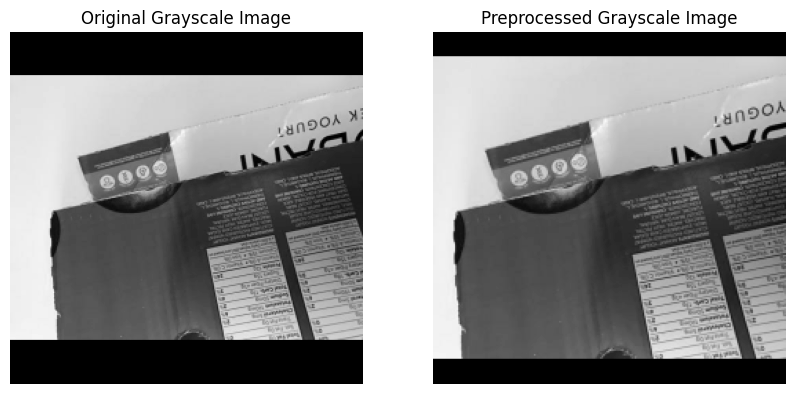

In [16]:
# Take one batch of samples from train_ds
sample_image = next(iter(train_ds.take(1)))

# Unpack the image and label
sample_image_data, sample_label = sample_image

# Preprocess the sample image (passing only the image part, not the label)
sample_prep_data, _ = preprocess(sample_image_data, sample_label)

# Convert RGB images to grayscale by averaging across the color channels
sample_image_gray = tf.reduce_mean(sample_image_data, axis=-1)
sample_prep_gray = tf.reduce_mean(sample_prep_data, axis=-1)

# Plot the images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the original grayscale image
axs[0].imshow(sample_image_gray[0], cmap="gray")
axs[0].set_title("Original Grayscale Image")
axs[0].axis("off")

# Plot the preprocessed grayscale image
axs[1].imshow(sample_prep_gray[0], cmap="gray")
axs[1].set_title("Preprocessed Grayscale Image")
axs[1].axis("off")

plt.show()


In [17]:
SHUFFLE_BUFFER_SIZE = 1000
PREFETCH_BUFFER_SIZE = tf.data.AUTOTUNE

train_ds_final = (train_ds_prep
                  .cache()
                  .shuffle(SHUFFLE_BUFFER_SIZE)
                  .prefetch(PREFETCH_BUFFER_SIZE)
                  )

val_ds_final = (val_ds_prep
                .cache()
                .prefetch(PREFETCH_BUFFER_SIZE)
                )

# test_ds_final = (test_ds_prep
#                .cache()
#                .prefetch(PREFETCH_BUFFER_SIZE)
#                )

## Preparing Inference Model

In [18]:
def create_pre_trained_model():
    pre_trained_model = EfficientNetV2B2(
        include_top=False,
        input_shape=(224,224,3),
        weights="imagenet",
        include_preprocessing=False,
    )
    # Ensure you replace 'pre_trained_model' with your actual model variable
    start_freezing_layer_name = 'block6a_expand_conv'  # Name of the layer to start freezing from

    # Set all layers before 'block6a_expand_conv' to trainable=False
    freeze = True
    for layer in pre_trained_model.layers:
        if layer.name == start_freezing_layer_name:
            freeze = False  # Start training from this layer onwards
        layer.trainable = not freeze

    # Ensure all BN layers are non-trainable
    for layer in pre_trained_model.layers:
        if isinstance(layer, tf.keras.layers.BatchNormalization):
            layer.trainable = False  # Force BN layers to remain non-trainable

    return pre_trained_model

pre_trained_model = create_pre_trained_model()
pre_trained_model.summary()

Model: "efficientnetv2-b2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, 112, 112, 16)   │          4,608 │ stem_activation[0][0]  │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn        │ (None, 112, 112, 16)   │             64 │ block1a_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_activati… │ (None, 112, 112, 16)   │              0 │ block1a_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_conv      │ (None, 112, 112, 16)   │          2,304 │ block1a_project_activ… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_bn        │ (None, 112, 112, 16)   │             64 │ block1b_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_activati… │ (None, 112, 112, 16)   │              0 │ block1b_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_drop (Dropout)    │ (None, 112, 112, 16)   │              0 │ block1b_project_activ… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_add (Add)         │ (None, 112, 112, 16)   │              0 │ block1b_drop[0][0],    │
│                           │                        │                │ block1a_project_activ… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_conv       │ (None, 56, 56, 64)     │          9,216 │ block1b_add[0][0]      │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_bn         │ (None, 56, 56, 64)     │            256 │ block2a_expand_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 8,769,374 (33.45 MB)

 Trainable params: 6,532,882 (24.92 MB)

 Non-trainable params: 2,236,492 (8.53 MB)

In [19]:
last_output = pre_trained_model.output

print(last_output.shape)

(None, 7, 7, 1408)


In [20]:
def create_augmentation_model():
    FILL_MODE = 'nearest'

    augmentation_model = tf.keras.Sequential([
        keras.Input(shape=(224, 224, 3)),
        tf.keras.layers.RandomFlip("horizontal_and_vertical"),
        tf.keras.layers.RandomRotation(0.2, fill_mode = FILL_MODE),
        tf.keras.layers.RandomTranslation(0.2, 0.2, fill_mode = FILL_MODE),
        tf.keras.layers.RandomZoom(0.2, fill_mode = FILL_MODE),
    ])

    return augmentation_model

augmentation_model = create_augmentation_model()

In [21]:
# def get_hp(hp):
#     """Retrieve and organize hp."""
#     hp = {
#         'dense_units': hp.Int('dense_units', min_value=256, max_value=2048, step=2, sampling='log'),
#         'dense_l2': hp.Float('dense_l2', min_value=1e-6, max_value=1e-2, sampling='log'),
#         'dropout_1': hp.Float('dropout_1', min_value=0.2, max_value=0.5, sampling='linear'),
#         'learning_rate': hp.Float('learning_rate', min_value=1e-5, max_value=3e-4, sampling='log')
#     }
#     return hp

# def create_model(hp):
#     hp = get_hp(hp)  # Get hp

#     inputs = tf.keras.Input(shape=(224, 224, 3))
#     x = augmentation_model(inputs)
#     x = pre_trained_model(x)
#     x = tf.keras.layers.GlobalAveragePooling2D()(x)

#     x = tf.keras.layers.Dense(
#         hp['dense_units'],
#         activation='relu',
#         kernel_regularizer=regularizers.l2(hp['dense_l2'])
#     )(x)

#     x = tf.keras.layers.Dropout(hp['dropout_1'])(x)
#     outputs = tf.keras.layers.Dense(12, activation='softmax')(x)

#     model = tf.keras.Model(inputs=inputs, outputs=outputs)

#     model.compile(
#         optimizer=tf.keras.optimizers.Adam(learning_rate=hp['learning_rate']),
#         loss='categorical_crossentropy',
#         metrics=['accuracy']
#     )

#     return model

In [22]:
def create_model():
    inputs = tf.keras.Input(shape=(224, 224, 3))

    x = augmentation_model(inputs)
    x = pre_trained_model(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    X = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Dropout(0.2)(x)

    outputs = tf.keras.layers.Dense(12, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)

    model = tf.keras.Model(inputs = inputs, outputs = outputs)

    model.compile(
        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, weight_decay=1e-4),
        loss = 'categorical_crossentropy',
        metrics = ['accuracy']
    )

    return model

In [23]:
# model = create_model(kt.HyperParameters())
model = create_model()
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b2 (Functional)       │ (None, 7, 7, 1408)          │       8,769,374 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1408)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1408)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 12)                  │          16,908 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,786,282 (33.52 MB)

 Trainable params: 6,549,790 (24.99 MB)

 Non-trainable params: 2,236,492 (8.53 MB)

In [24]:
# Define the log directory
log_dir = 'logs/efficientv2-b2_tuning'

early_stopping = EarlyStopping(
    monitor='val_loss',       # Monitors the validation loss
    min_delta=0.0033,          # Minimum change to qualify as an improvement
    patience=10,               # Number of epochs to wait for improvement
    verbose=1,                # Verbosity mode
    mode='min',               # Stop when the monitored quantity has stopped decreasing
    restore_best_weights=True
)

# Create the ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    min_lr=1e-10,
    verbose=1
)

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [25]:
history = model.fit(train_ds_final,
                    validation_data = val_ds_final,
                    epochs = 100,
                    verbose = 2,
                    callbacks = [tensorboard_callback,
                                 reduce_lr,
                                 early_stopping]
                    )

Epoch 1/100
194/194 - 116s - 596ms/step - accuracy: 0.7753 - loss: 0.7440 - val_accuracy: 0.9220 - val_loss: 0.2587 - learning_rate: 1.0000e-04
Epoch 2/100
194/194 - 105s - 543ms/step - accuracy: 0.9057 - loss: 0.3144 - val_accuracy: 0.9395 - val_loss: 0.1937 - learning_rate: 1.0000e-04
Epoch 3/100
194/194 - 56s - 291ms/step - accuracy: 0.9259 - loss: 0.2412 - val_accuracy: 0.9524 - val_loss: 0.1463 - learning_rate: 1.0000e-04
Epoch 4/100
194/194 - 82s - 420ms/step - accuracy: 0.9382 - loss: 0.1987 - val_accuracy: 0.9589 - val_loss: 0.1375 - learning_rate: 1.0000e-04
Epoch 5/100
194/194 - 82s - 421ms/step - accuracy: 0.9506 - loss: 0.1594 - val_accuracy: 0.9647 - val_loss: 0.1149 - learning_rate: 1.0000e-04
Epoch 6/100
194/194 - 56s - 290ms/step - accuracy: 0.9509 - loss: 0.1458 - val_accuracy: 0.9621 - val_loss: 0.1223 - learning_rate: 1.0000e-04
Epoch 7/100

Epoch 7: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
194/194 - 82s - 421ms/step - accuracy: 0.9630 - los

In [26]:
# tuner = kt.BayesianOptimization(
#     hypermodel=create_model,
#     objective='val_accuracy',
#     max_trials=75,
#     executions_per_trial=1,
#     overwrite=True,
#     directory='hypertuning',
#     project_name='efficientnetv2b2_hypertune_t1'
# )

# tuner.search(
#     train_ds_final,
#     validation_data=val_ds_final,
#     epochs=100,
#     callbacks=[tensorboard_callback, early_stopping]
# )

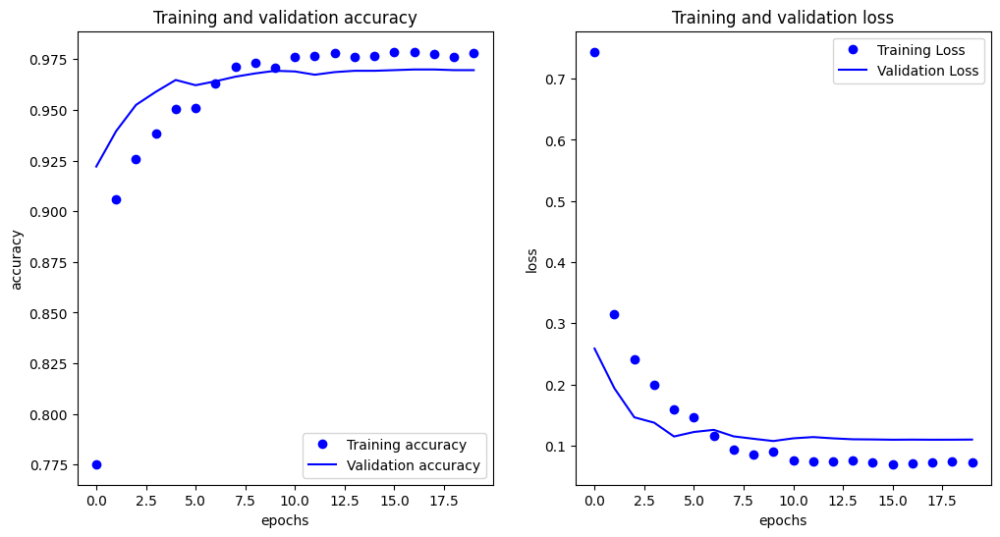

In [27]:
def plot_loss_acc(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    fig, ax = plt.subplots(1,2, figsize=(12, 6))
    ax[0].plot(epochs, acc, 'bo', label='Training accuracy')
    ax[0].plot(epochs, val_acc, 'b', label='Validation accuracy')
    ax[0].set_title('Training and validation accuracy')
    ax[0].set_xlabel('epochs')
    ax[0].set_ylabel('accuracy')
    ax[0].legend()

    ax[1].plot(epochs, loss, 'bo', label='Training Loss')
    ax[1].plot(epochs, val_loss, 'b', label='Validation Loss')
    ax[1].set_title('Training and validation loss')
    ax[1].set_xlabel('epochs')
    ax[1].set_ylabel('loss')
    ax[1].legend()

    plt.show()

plot_loss_acc(history)

In [28]:
%load_ext tensorboard
%tensorboard --logdir=logs/efficientv2-b2_tuning

<IPython.core.display.Javascript object>

In [29]:
# # Get the best hyperparameters from the search
# best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# # Print the best hyperparameters
# print("Best hyperparameters:")
# for key, value in best_hps.values.items():
#     print(f"{key}: {value}")

# # Rebuild the model with the best hyperparameters
# best_model = tuner.hypermodel.build(best_hps)

# # Optionally, you can train the best model on the full dataset
# history = best_model.fit(
#     train_ds_final,
#     validation_data=val_ds_final,
#     epochs=100,
#     callbacks=[tensorboard_callback, early_stopping]
# )

In [31]:
# loss, accuracy = model.evaluate(test_ds_final, verbose=1)
# print("Test Accuracy:", accuracy)
# print("Test Loss:", loss)

In [32]:
model_name = "efficientnetb4_waste_nomod_64.keras"
tf.keras.models.save_model(model, model_name)

In [33]:
type(model)

keras.src.models.functional.Functional

## !! PREDICT FROM HERE !!

In [1]:
# IMPORT TENSORFLOW
import tensorflow as tf

# IMPORT KERAS
import keras
from keras import regularizers
from keras.applications import EfficientNetV2B2, efficientnet_v2
from keras.callbacks import Callback, TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# IMPORT OTHERS
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from io import BytesIO
from PIL import Image
import io

In [2]:
model = keras.models.load_model('efficientnetv2_b2_waste_nomod_64.keras')

In [3]:
image_path = 'plastik.jpg'

def load_image(image_path):
    with open(image_path, 'rb') as file:
        image_bytes = file.read()
        pillow_img = Image.open(io.BytesIO(image_bytes))
    return pillow_img

def transform(image):
    data = np.asarray(image)
    data = np.float32((data / 127.5) - 1)
    data = np.expand_dims(data, axis=0)

    data = keras.layers.Resizing(256, 256, pad_to_aspect_ratio=True)(data)
    data = keras.layers.CenterCrop(224, 224)(data)
    return data

In [ ]:
# class_names = [ name for name in train_ds.class_names ]
# print(class_names)

In [4]:
class_names = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']

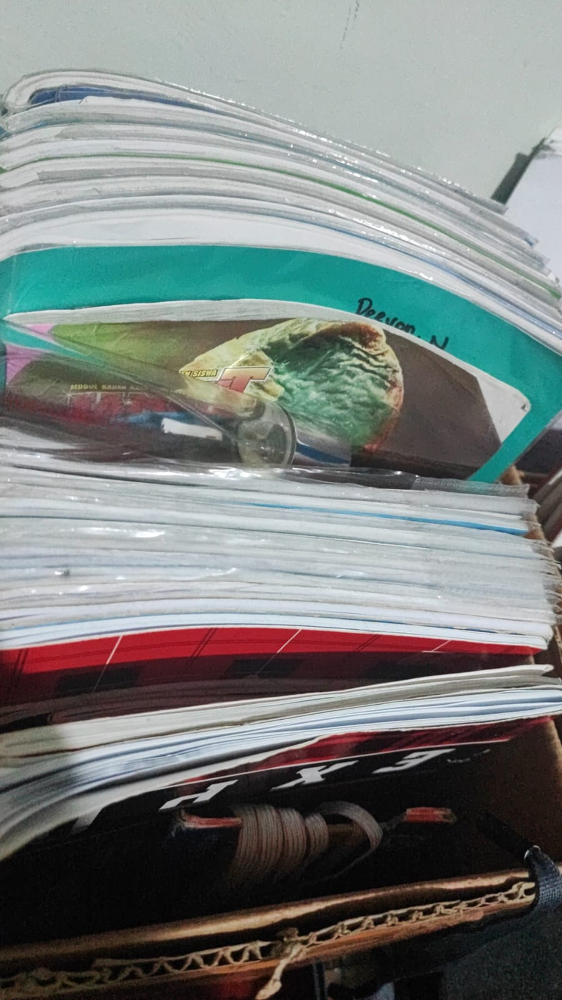

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Rank   Class Name           Confidence  
----------------------------------------
1      paper                0.7127      
2      clothes              0.2095      
3      shoes                0.0489      
4      metal                0.0156      
5      cardboard            0.0110      
6      biological           0.0006      
7      plastic              0.0006      
8      white-glass          0.0005      
9      battery              0.0003      
10     brown-glass          0.0002      
11     green-glass          0.0001      
12     trash                0.0000      


In [11]:
image = load_image('terselubung2.jpg')

display(image)

image = transform(image)

prediction = model.predict(image)
prediction_sort = np.argsort(prediction[0])[::-1]
prediction_names = [class_names[i] for i in prediction_sort]
prediction_confidence = prediction[0][prediction_sort]

print(f"{'Rank':<6} {'Class Name':<20} {'Confidence':<12}")
print("-" * 40)
# Print the top 3 predictions
for i in range(len(prediction_sort)):
    print(f"{i+1:<6} {prediction_names[i]:<20} {prediction_confidence[i]:<12.4f}")

In [ ]:
# prediction = model.predict(data)

# predicted_index = prediction.argmax(axis=-1)[0]  # Get the index of the highest probability


# # Get the class name using the index
# predicted_class_name = class_names[predicted_index]

# # Print the predicted class name
# print("Predicted class:", predicted_class_name)
# print(prediction)

In [ ]:
# loaded_model = keras.models.load_model('efficientnetv2_b2_t1.keras')
# load_acc, load_loss = loaded_model.evaluate(test_ds_final)
# acc, loss = model.evaluate(test_ds_final)
# # Print the predicted class name
# print("Model prediction:")
# print(prediction)

# print("Loaded prediction:" )
# print(loaded_pred)